## Imports

In [1]:
# !pip install tensorflow-hub
# !pip install tensorflow
# !pip install scikit-image
# !pip install pydot
# !pip install graphviz

In [2]:
import os
import cv2
import copy
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import matplotlib.pyplot as mpplot

from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, concatenate

# Data Pipeline


In [6]:
# hyper-parameters

img_size = 224
miss_size = 200
img_channels = 3
missing_rate = 0.9
splitting_rate = 0.8
window_len = 200
csi_matrix_shape = (window_len, 208)

In [7]:
%cd /mnt/nas/Datasets/Project_02/Indoors
!ls


# images
raw_img = np.load('./Images/camera_1/raw_img_(224_224).npy', allow_pickle=True, encoding="latin1") 


# CSI
csi_01 = np.load('./CSI/amp_01.npy', allow_pickle=True, encoding="latin1")
csi_02 = np.load('./CSI/amp_02.npy', allow_pickle=True, encoding="latin1")
csi_03 = np.load('./CSI/amp_03.npy', allow_pickle=True, encoding="latin1")
csi_04 = np.load('./CSI/amp_04.npy', allow_pickle=True, encoding="latin1")

csi_05 = np.load('./CSI/amp_05.npy', allow_pickle=True, encoding="latin1")
csi_06 = np.load('./CSI/amp_06.npy', allow_pickle=True, encoding="latin1")
csi_07 = np.load('./CSI/amp_07.npy', allow_pickle=True, encoding="latin1")
csi_08 = np.load('./CSI/amp_08.npy', allow_pickle=True, encoding="latin1")

csi_09 = np.load('./CSI/amp_09.npy', allow_pickle=True, encoding="latin1")



/mnt/nas/Proj2_dataset
CSI   camera_1	camera_3	    model_architecture.pdf
RSSI  camera_2	model_architecture  model_architecture.png


In [8]:
# making CSI matrixes

def making_csi_matrix(csi):
 
    train_csi_set = []
    test_csi_set = []
    
    total_csi_num = csi.shape[0]
    time_stamp = int(splitting_rate*total_csi_num) 
    
    for count in range(int(0.5*window_len), time_stamp-int(0.5*window_len)): 
        train_csi_matrix = []
        for i in range(count-int(0.5*window_len), count+int(0.5*window_len)):
            train_csi_matrix.append(csi[i])
        train_csi_set.append(train_csi_matrix)
       

    for count in range(time_stamp + int(0.5*window_len), int(total_csi_num-window_len*0.5)):  
        test_csi_matrix = []
        for i in range(count-int(0.5*window_len), count+int(0.5*window_len)):
            test_csi_matrix.append(csi[i])
        test_csi_set.append(test_csi_matrix) 
    
    
    train_csi_set = np.array(train_csi_set)
    test_csi_set = np.array(test_csi_set)
    
    return train_csi_set, test_csi_set


train_csi_set_01, test_csi_set_01 =  making_csi_matrix(csi_01)
train_csi_set_02, test_csi_set_02 =  making_csi_matrix(csi_02)
train_csi_set_03, test_csi_set_03 =  making_csi_matrix(csi_03)
train_csi_set_04, test_csi_set_04 =  making_csi_matrix(csi_04)

In [9]:
# test 

print(train_csi_set_01.shape)

(9400, 200, 208)


In [11]:
def image_splitter(img_set):

    train_gd_img = []
    test_gd_img = []
    
    total_img_num = img_set.shape[0]
    time_stamp = int(splitting_rate*total_img_num) 

    for count in range(int(0.5*window_len), int(time_stamp-window_len*0.5)):  
        img_set[count] = cv2.cvtColor(img_set[count], cv2.COLOR_BGR2RGB)     
        train_gd_img.append(img_set[count]) 
       
    for count in range(time_stamp + int(0.5*window_len), int(total_img_num-window_len*0.5)): 
        img_set[count] = cv2.cvtColor(img_set[count], cv2.COLOR_BGR2RGB)     
        test_gd_img.append(img_set[count]) 
    
    
    train_gd_img = np.array(train_gd_img)
    test_gd_img = np.array(test_gd_img)
    
    return train_gd_img, test_gd_img


train_gd_img, test_gd_img = image_splitter(raw_img)

In [12]:
# test 
print(train_gd_img.shape)
print('num of train_img:', len(train_gd_img))
print('num of test_img:', len(test_gd_img))
print('type of train_img:', type(train_gd_img))

(9400, 224, 224, 3)
num of train_img: 9400
num of test_img: 2200
type of train_img: <class 'numpy.ndarray'>


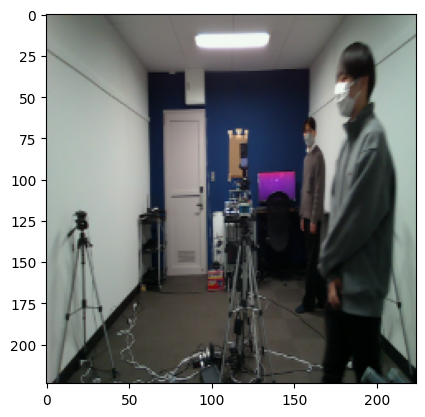

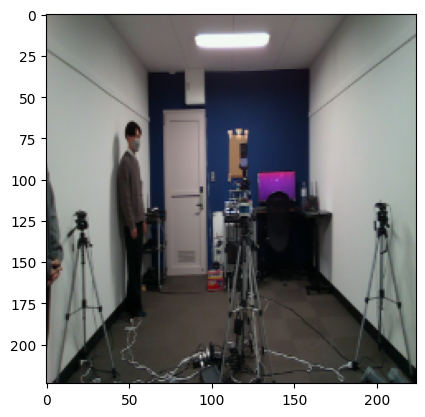

In [13]:
# test 

plt.imshow(train_gd_img[0])
plt.show()

plt.imshow(test_gd_img[0])
plt.show()

In [14]:
# generate a missing part 

def get_blocked_img(img_set):
    
    blocked_img_set = []
    
    for raw_image in img_set:
        img = copy.deepcopy(raw_image)
        img[:, :miss_size , :] = 0
        blocked_img_set.append(img)

    blocked_img_set = np.array(blocked_img_set)

    return blocked_img_set

train_blocked_img = get_blocked_img(train_gd_img)
test_blocked_img = get_blocked_img(test_gd_img)

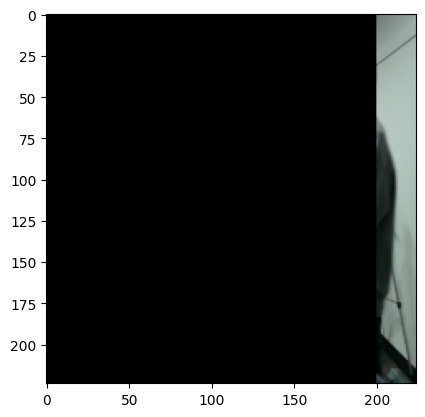

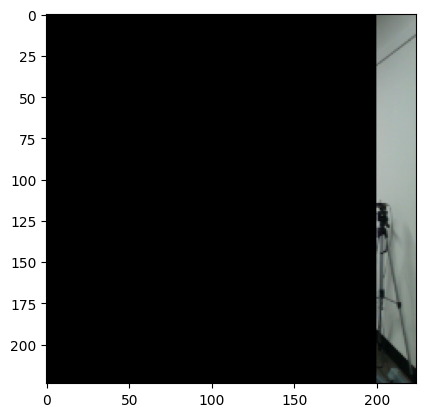

In [15]:
# test 

plt.imshow(train_blocked_img[0])
plt.show()

plt.imshow(test_blocked_img[0])
plt.show()

# Model Utility

In [16]:
# Hyperparameters

transformer_layers = 8
num_heads = 4
projection_dim = 1000
transformer_units = [projection_dim * 2, projection_dim]
transformer_layers = 8
mlp_head_units = [2048, 1024]  
learning_rate = 0.001
batch_size = 32
num_epochs = 50


# Pretrained Model
MODEL_PATH = "https://tfhub.dev/sayakpaul/swin_base_patch4_window7_224_fe/1"

In [17]:
def mlp_1(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

def mlp_2(input):
    x = layers.BatchNormalization()(input)
    x = layers.Dense(2048, activation='relu')(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(784, activation='relu')(x)
    output = layers.Reshape([28, 28, 1])(x)
    return output

def Transformer(csi_1, csi_2, csi_3, csi_4, transformer_layers, num_heads, projection_dim, transformer_units):
    csi = layers.Concatenate()([csi_1, csi_2, csi_3, csi_4])
    encoded_input = layers.Dense(units=projection_dim)(csi)

    for i in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_input)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim, dropout=0.1)(x1, x1)
        x2 = layers.Add()([attention_output, encoded_input])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = mlp_1(x3, hidden_units=transformer_units, dropout_rate=0.1)
        representation = layers.Add()([x3, x2])

    representation = layers.LayerNormalization(epsilon=1e-6)(representation)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)
    output = mlp_2(representation)
    return output

def Imager(csi_info, img_info_1, img_info_2):
    x = layers.concatenate([csi_info, img_info_1, img_info_2])
    
    x = layers.Conv2D(32, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
    
    x = layers.Conv2D(64, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x
                                        
    x = layers.Conv2D(128, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
    
    x = layers.concatenate([x, img])
    outputs = layers.Conv2D(3, 3, activation='relu', padding="same")(x)
    return outputs


# Define the model creation function
def Trans_Inpainter(model_url, image_size, transformer_layers, num_heads, projection_dim, transformer_units):

    # input 
    csi_1 = Input(shape=csi_matrix_shape)
    csi_2 = Input(shape=csi_matrix_shape)
    csi_3 = Input(shape=csi_matrix_shape)
    csi_4 = Input(shape=csi_matrix_shape)
    img = Input((image_size, image_size, 3))
    
    # csi processing
    csi_info = Transformer(csi_1, csi_2, csi_3, csi_4, transformer_layers, num_heads, projection_dim, transformer_units)

    # image processing
    hub_module = hub.KerasLayer(model_url, trainable=True)
    x = hub_module(img, training=False)
    x = layers.Dense(784)(x)
    img_info_1 = layers.Reshape([28, 28, 1])(x)
    img_info_2 = layers.Resizing(28, 28, interpolation='bilinear', crop_to_aspect_ratio=False)(img)

    # decoder
    outputs = Imager(csi_info, img_info_1, img_info_2)

    return Model(inputs=[img, csi_1, csi_2, csi_3, csi_4], outputs=outputs)


In [18]:
model_url = MODEL_PATH
model = Trans_Inpainter(model_url, IMAGE_SIZE, transformer_layers, num_heads, projection_dim, transformer_units)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 200, 208)]           0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 200, 208)]           0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 200, 208)]           0         []                            
                                                                                                  
 input_4 (InputLayer)        [(None, 200, 208)]           0         []                            
                                                                                              

In [19]:
# plot the model
tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.0/47.0 kB 1.2 MB/s eta 0:00:00
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [20]:
!nvidia-smi

Sun Dec 10 13:00:04 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 470.74       CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA RTX A6000    On   | 00000000:86:00.0 Off |                  Off |
| 30%   59C    P2    86W / 300W |  47149MiB / 48685MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Training & Validation

In [21]:
from tensorflow.keras.callbacks import LearningRateScheduler
callback = LearningRateScheduler(lambda ep: float(1e-3 * 0.975**ep))
model.compile(optimizer='adam', loss=losses.MeanSquaredError(),)

history = model.fit(
        x=[train_blocked_img, train_csi_set_01, train_csi_set_02, train_csi_set_03, train_csi_set_04],
        y=train_gd_img,
        batch_size=batch_size,
        epochs=num_epochs,
        validation_split=0.1,
        callbacks=[callback])

Epoch 1/50
265/265 [==============================] - 281s 720ms/step - loss: 0.0164 - val_loss: 0.0085 - lr: 0.0010
Epoch 2/50
265/265 [==============================] - 170s 641ms/step - loss: 0.0064 - val_loss: 0.0061 - lr: 9.7500e-04
Epoch 3/50
265/265 [==============================] - 167s 629ms/step - loss: 0.0047 - val_loss: 0.0048 - lr: 9.5062e-04
Epoch 4/50
265/265 [==============================] - 166s 626ms/step - loss: 0.0039 - val_loss: 0.0060 - lr: 9.2686e-04
Epoch 5/50
265/265 [==============================] - 166s 627ms/step - loss: 0.0034 - val_loss: 0.0037 - lr: 9.0369e-04
Epoch 6/50
265/265 [==============================] - 166s 626ms/step - loss: 0.0031 - val_loss: 0.0037 - lr: 8.8110e-04
Epoch 7/50
265/265 [==============================] - 166s 625ms/step - loss: 0.0028 - val_loss: 0.0037 - lr: 8.5907e-04
Epoch 8/50
265/265 [==============================] - 166s 626ms/step - loss: 0.0027 - val_loss: 0.0034 - lr: 8.3759e-04
Epoch 9/50
265/265 [================

# Predictions

In [22]:
evaluations = model.evaluate([test_blocked_img, test_csi_set_01, test_csi_set_02, test_csi_set_03, test_csi_set_04], test_gd_img, verbose=0)
print("[val_loss, val_acc]", evaluations)
recovered_img = model.predict([test_blocked_img, test_csi_set_01, test_csi_set_02, test_csi_set_03, test_csi_set_04])

[val_loss, val_acc] 0.00193690019659698
69/69 [==============================] - 20s 237ms/step


In [51]:
print(recovered_img[0].shape)
print(test_gd_img[0].shape[:2])

(224, 224, 3)
(224, 224)


In [52]:
# SSIM
from skimage.metrics import structural_similarity as ssim

# Assuming test_gd_img and recovered_img are lists or arrays of images
# and that they have the same length
mean_ssim = 0
num_images = len(test_gd_img)

for i in range(num_images):
    ssim_value = ssim(test_gd_img[i], recovered_img[i], multichannel=True, win_size=11, channel_axis=2, data_range=1)
    mean_ssim += ssim_value

# Calculate the mean SSIM over all image pairs
mean_ssim /= num_images

print('Mean SSIM:', mean_ssim)



Mean SSIM: 0.9025948440486734


In [39]:
# PSNR

import skimage.measure
Mean_PSNR = 0

for i in range(Sum):
    Mean_PSNR += skimage.metrics.peak_signal_noise_ratio(test_gd_img[i], recovered_img[i], data_range=1.0)
    
Mean_PSNR = Mean_PSNR/Sum
print('Mean_PSNR is', Mean_PSNR)


Mean_PSNR is 28.495911168499454


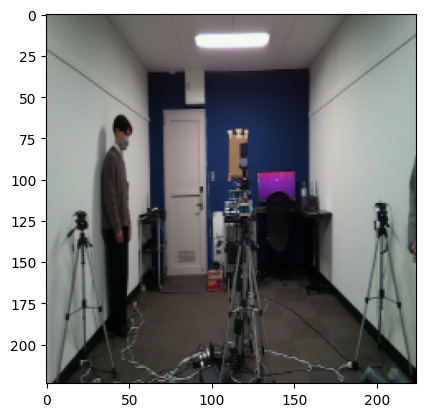

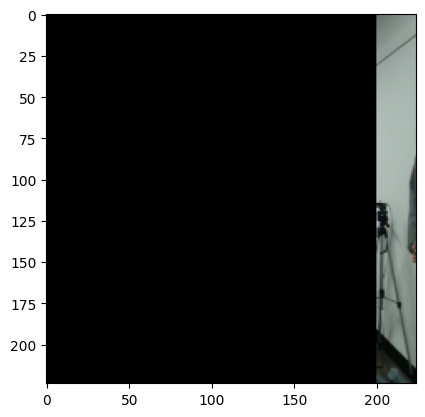

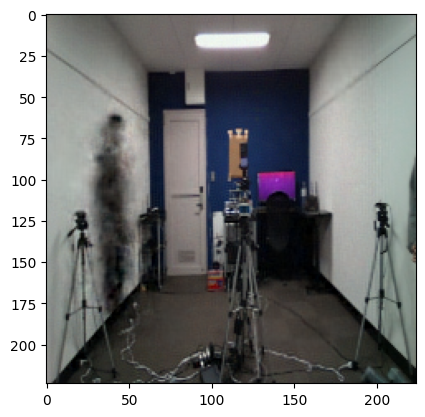

SSIM: 0.9182647
PSNR: 27.27129915288402
**************************************************************************************


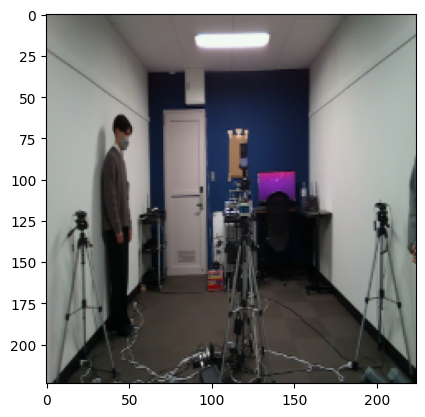

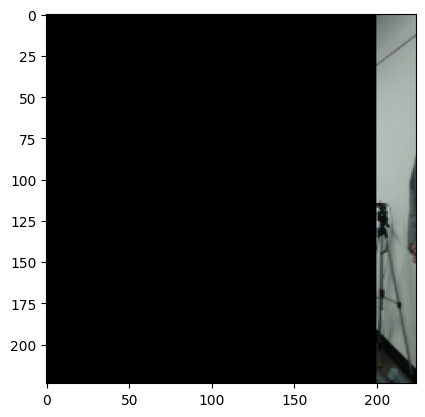

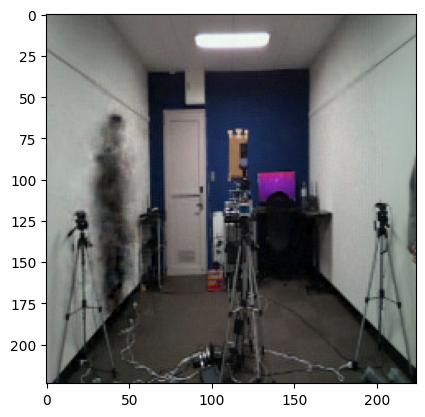

SSIM: 0.91616267
PSNR: 27.083714214681965
**************************************************************************************


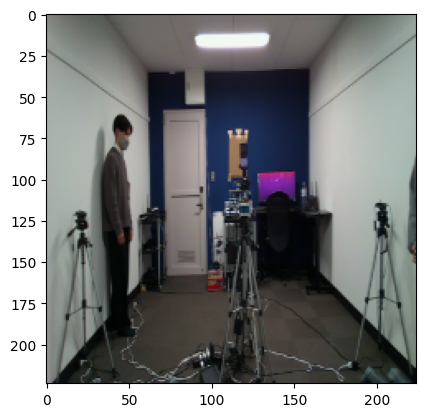

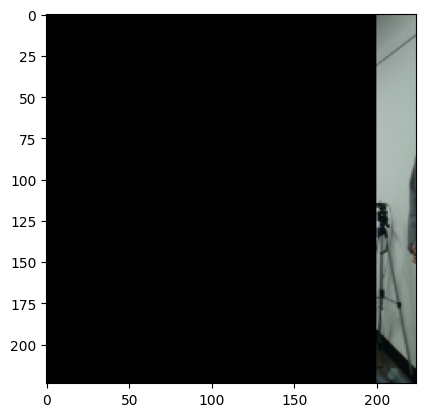

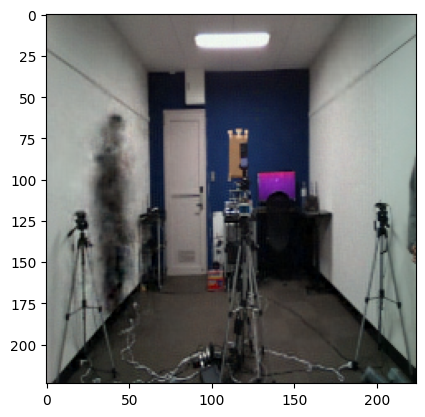

SSIM: 0.91534615
PSNR: 27.04201178179016
**************************************************************************************


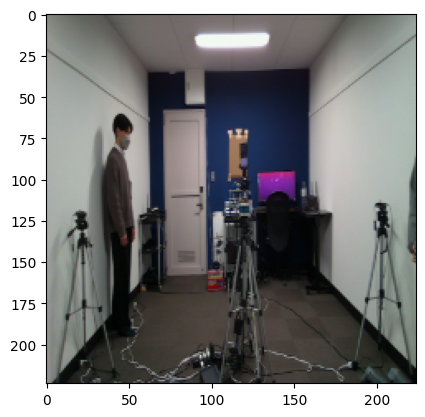

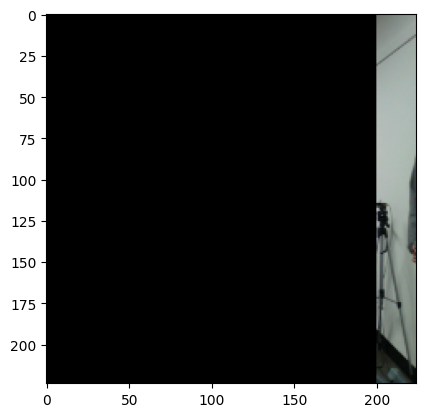

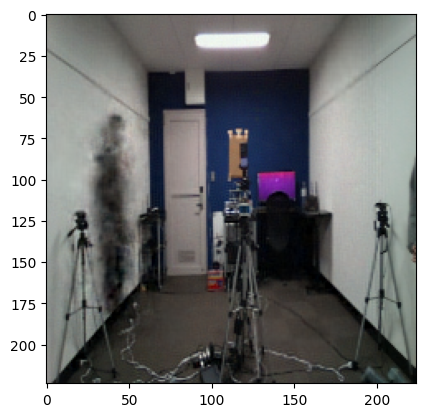

SSIM: 0.90869856
PSNR: 26.195127944060637
**************************************************************************************


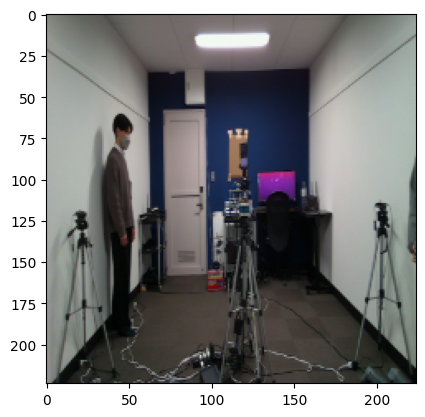

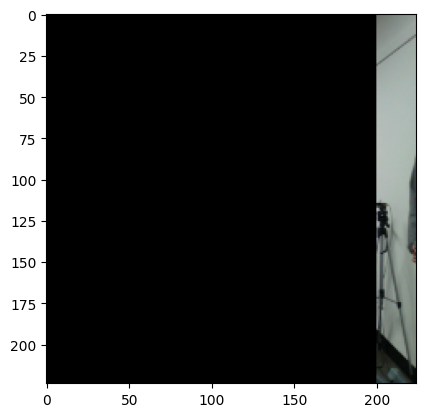

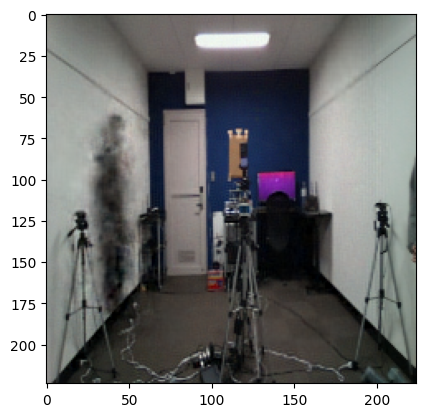

SSIM: 0.90822124
PSNR: 26.119427144228496
**************************************************************************************


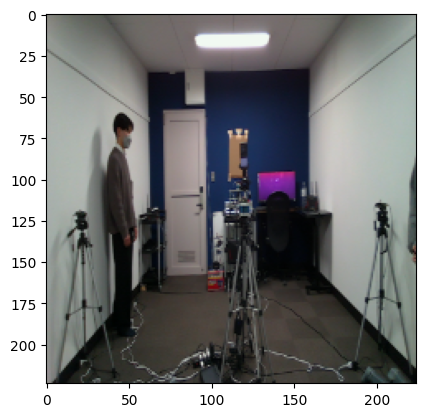

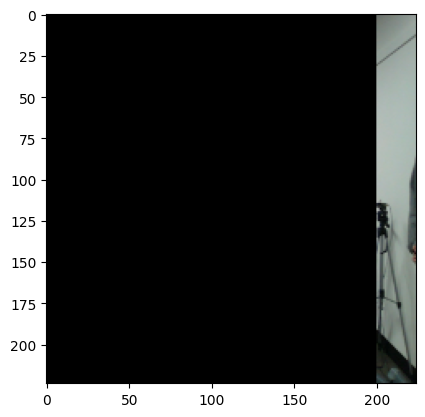

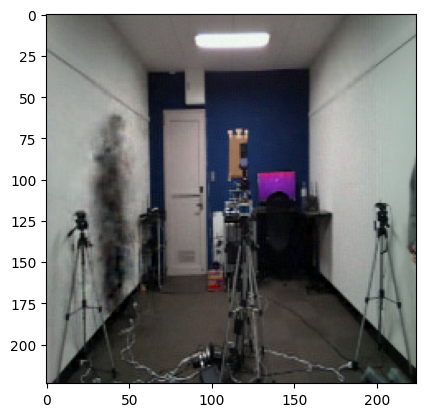

SSIM: 0.90158653
PSNR: 25.28976563836705
**************************************************************************************


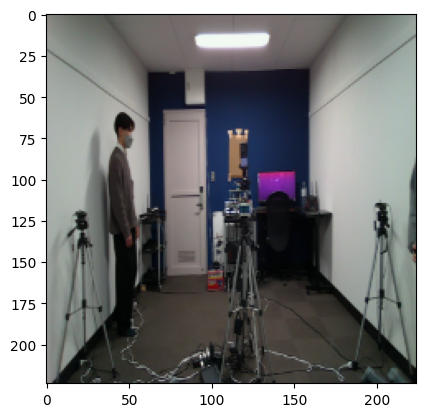

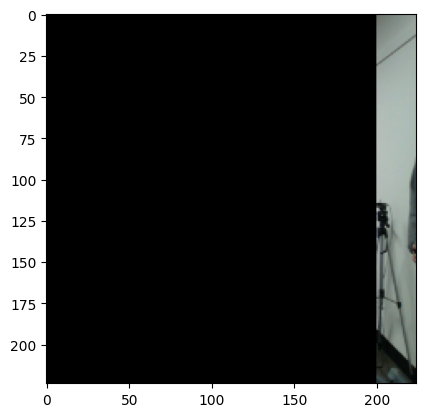

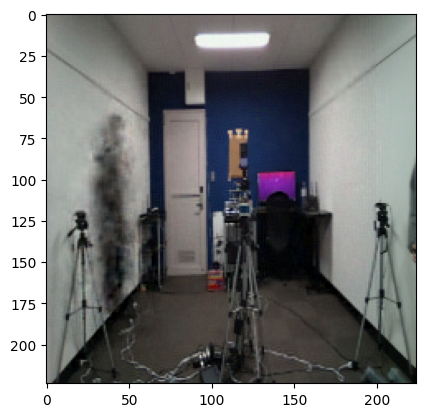

SSIM: 0.88943785
PSNR: 24.15013705041749
**************************************************************************************


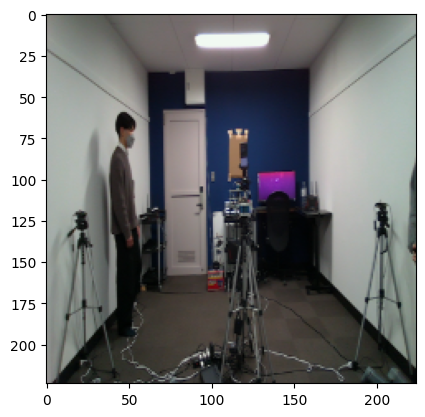

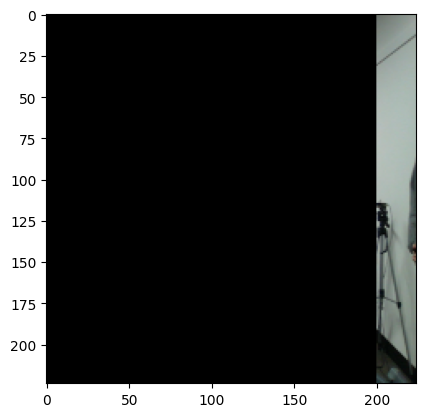

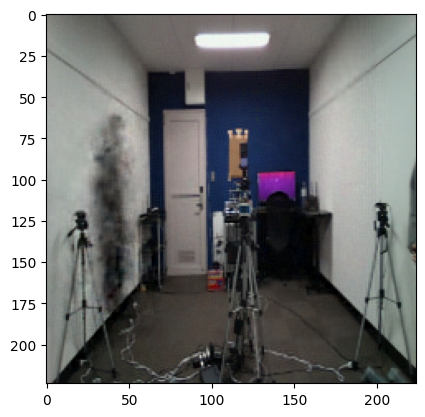

SSIM: 0.87853104
PSNR: 23.26606606292838
**************************************************************************************


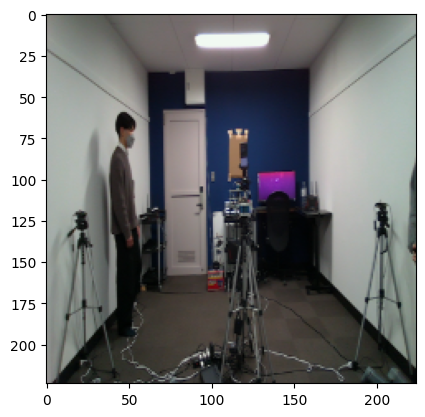

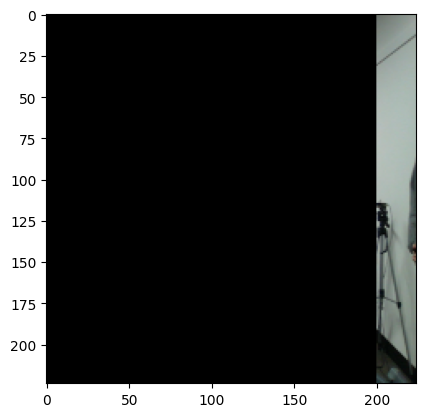

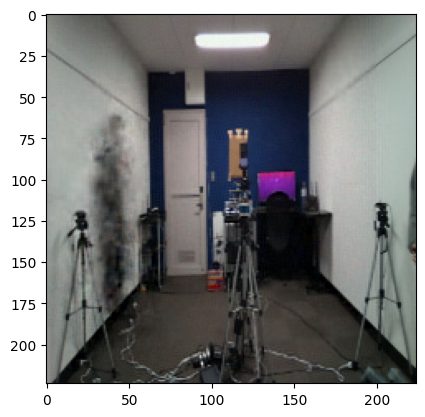

SSIM: 0.87905794
PSNR: 23.355054669847956
**************************************************************************************


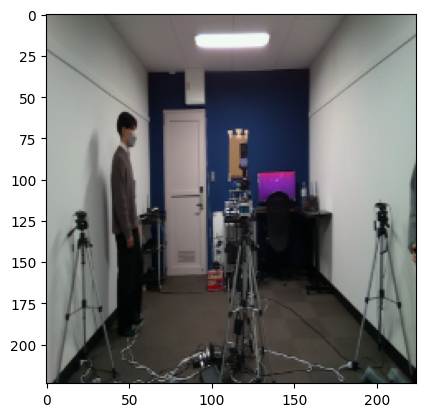

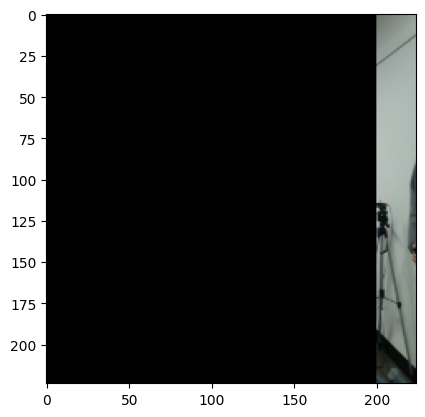

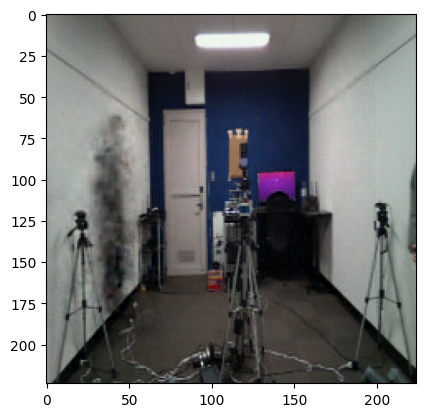

SSIM: 0.8722453
PSNR: 22.95954090985071
**************************************************************************************


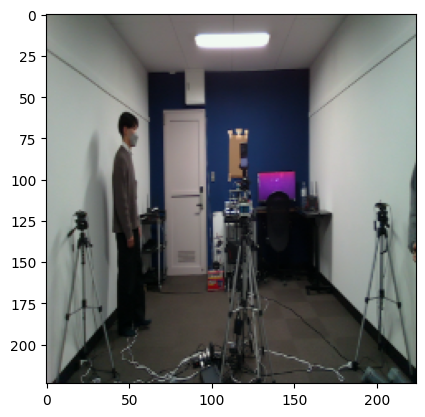

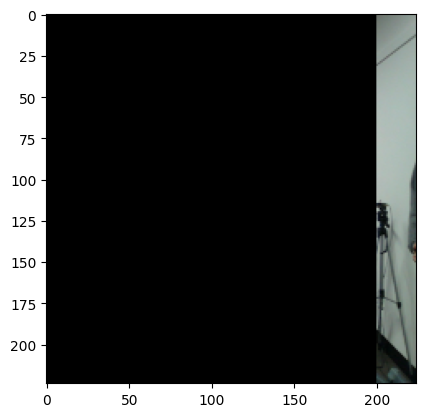

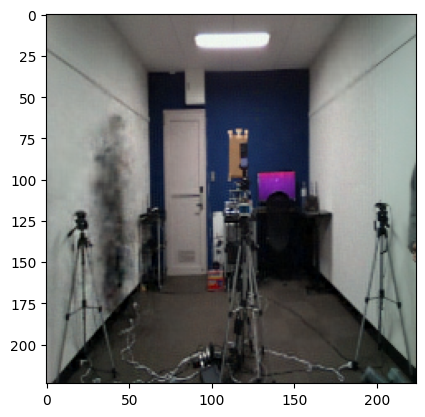

SSIM: 0.8683271
PSNR: 22.76840876730322
**************************************************************************************


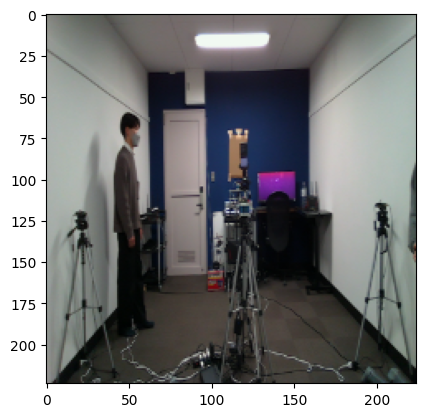

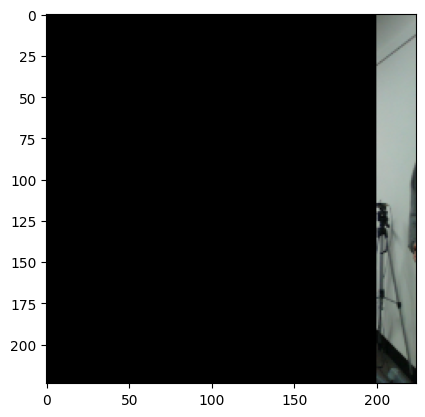

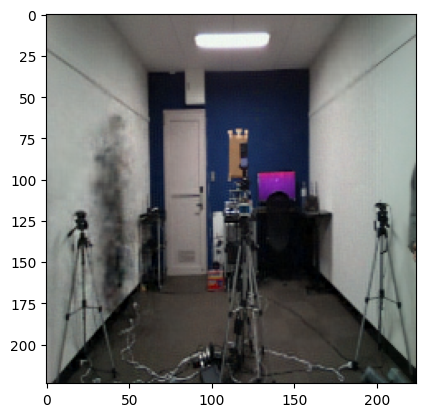

SSIM: 0.865613
PSNR: 22.50188600646873
**************************************************************************************


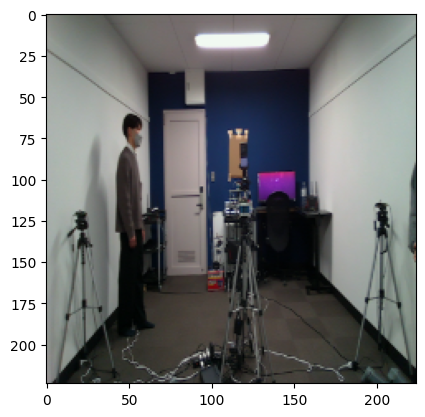

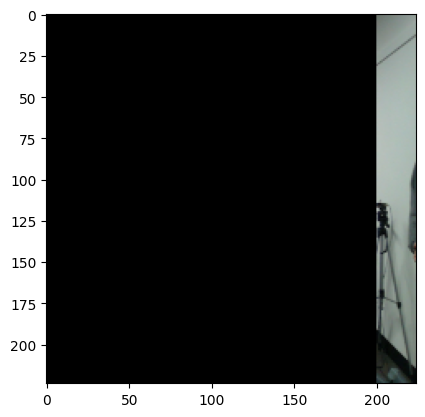

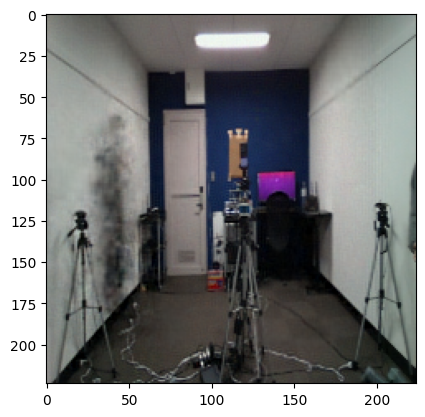

SSIM: 0.85915166
PSNR: 22.225794314864757
**************************************************************************************


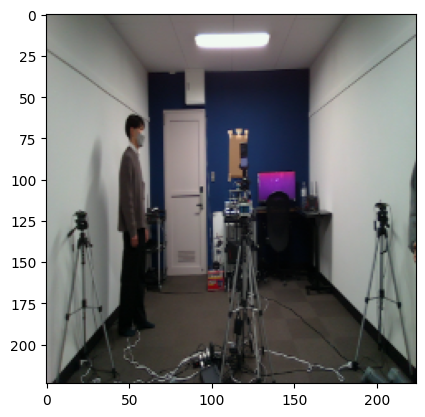

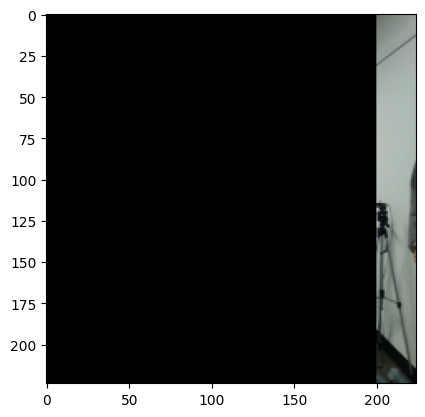

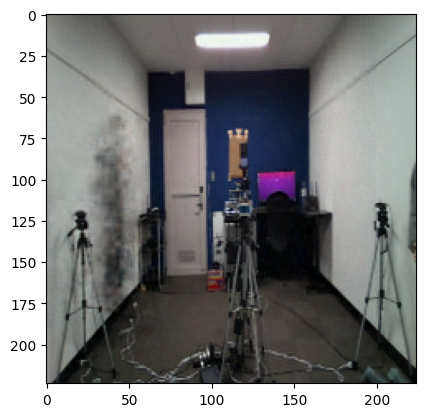

SSIM: 0.8534777
PSNR: 22.004175391639848
**************************************************************************************


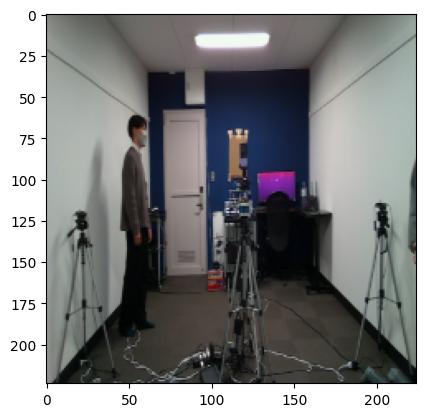

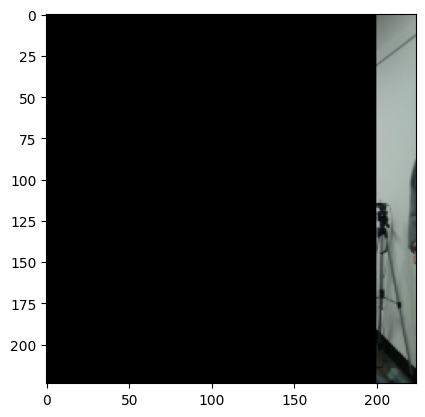

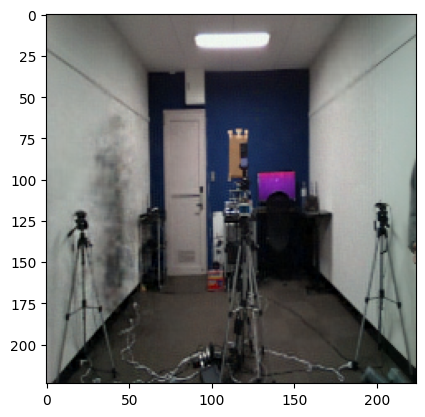

SSIM: 0.853735
PSNR: 22.1476295105682
**************************************************************************************


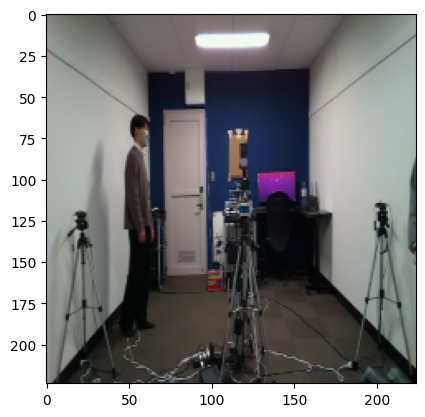

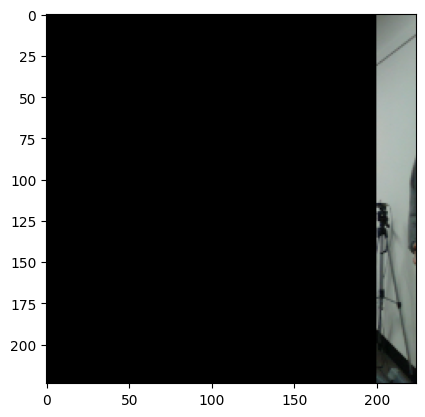

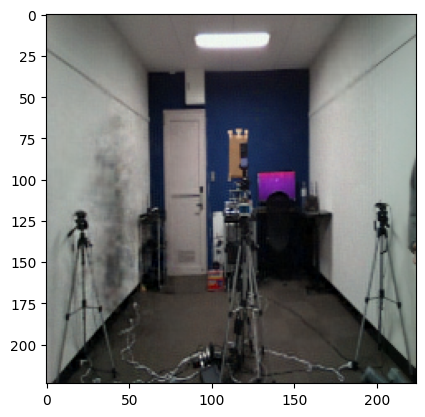

SSIM: 0.8572065
PSNR: 22.553186688322924
**************************************************************************************


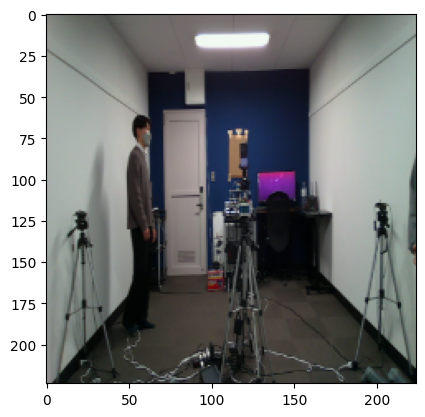

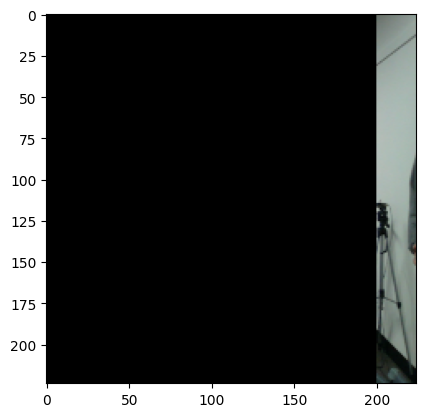

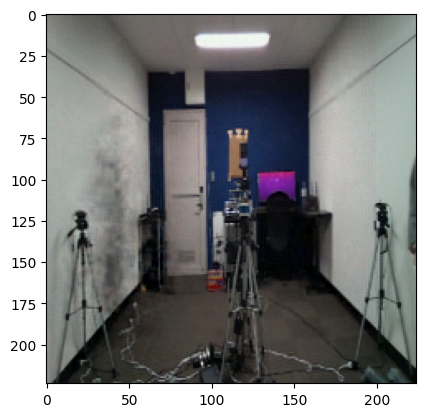

SSIM: 0.8630297
PSNR: 23.157140974548103
**************************************************************************************


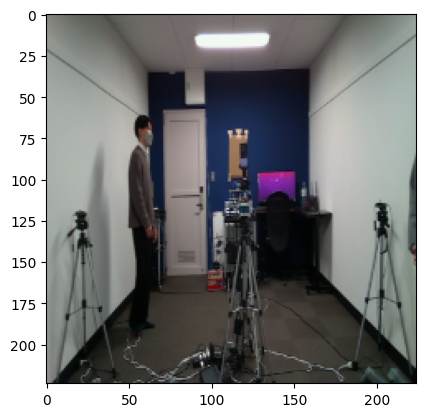

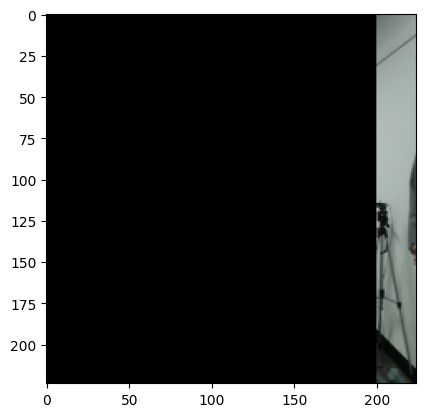

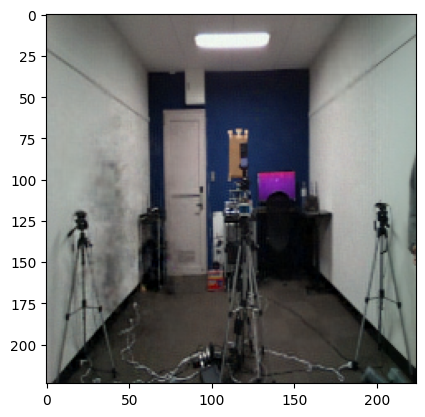

SSIM: 0.86837894
PSNR: 23.765876261094114
**************************************************************************************


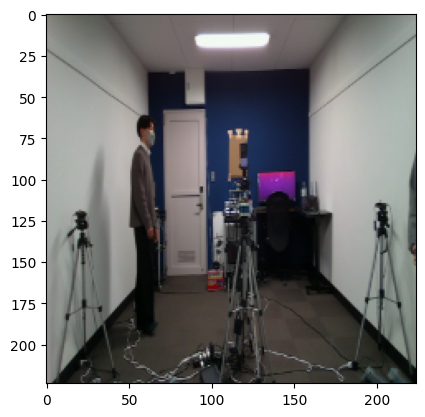

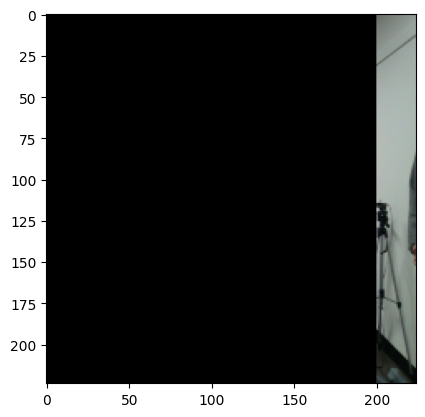

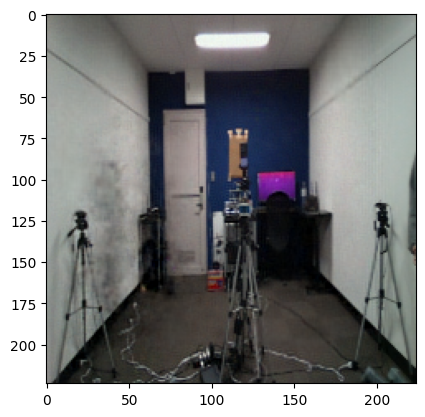

SSIM: 0.8737146
PSNR: 24.41370719020895
**************************************************************************************


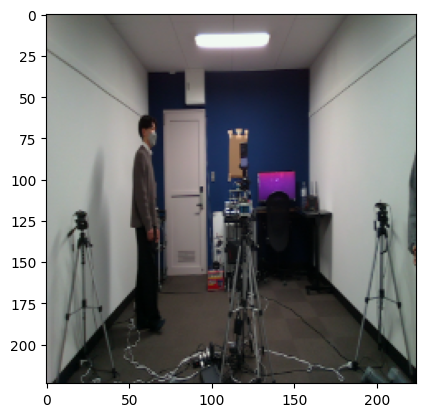

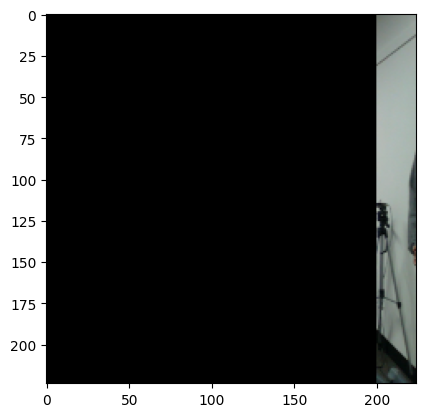

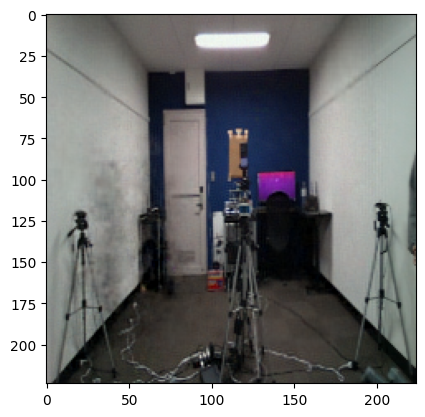

SSIM: 0.87619704
PSNR: 25.055627342190956
**************************************************************************************


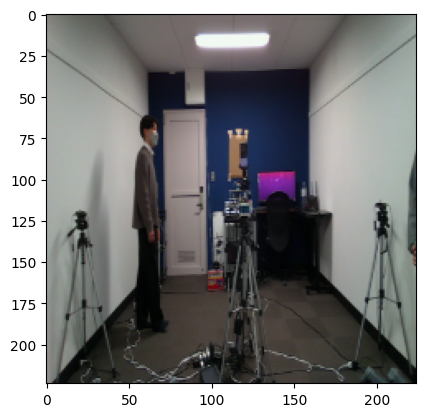

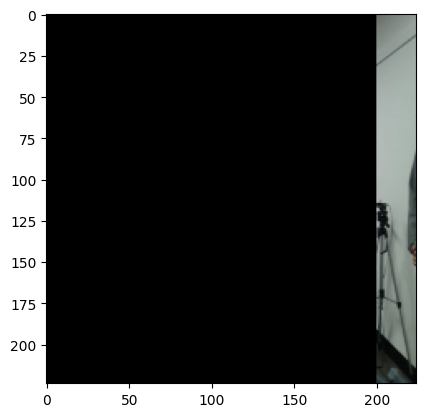

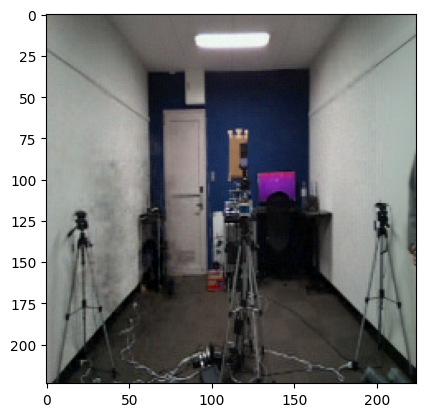

SSIM: 0.8781497
PSNR: 25.787852219789464
**************************************************************************************


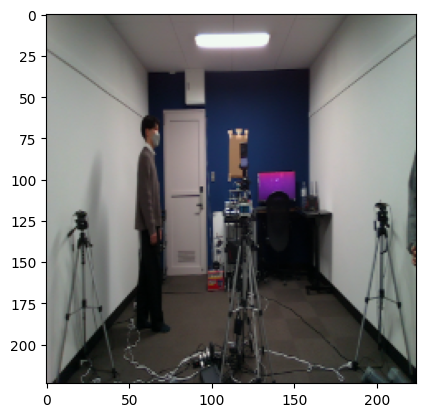

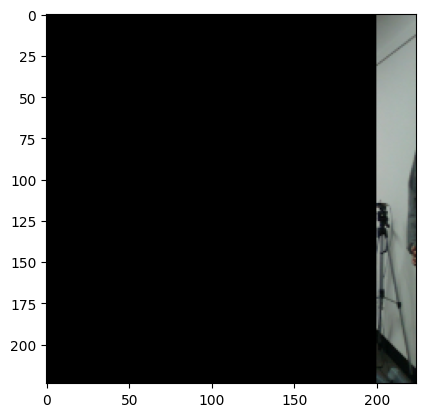

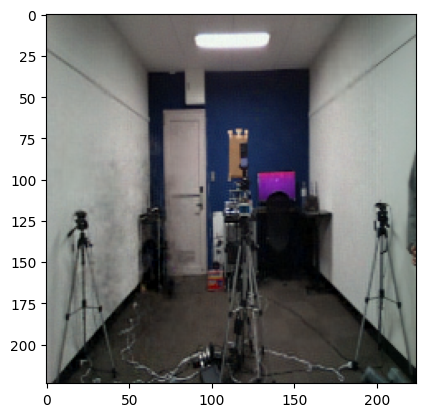

SSIM: 0.87973094
PSNR: 26.55366814571188
**************************************************************************************


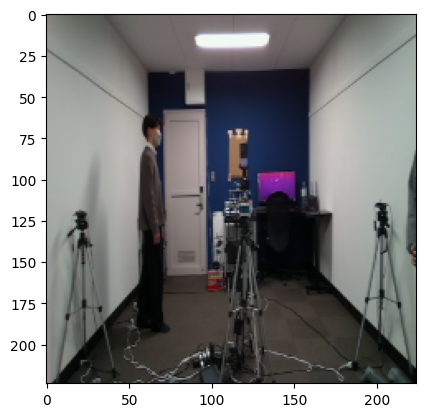

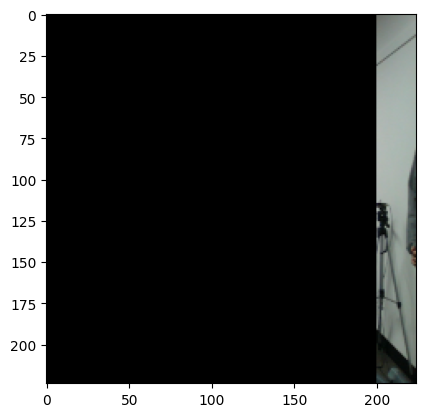

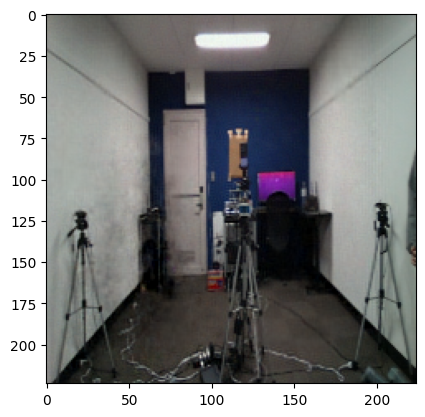

SSIM: 0.8861401
PSNR: 27.32216446601943
**************************************************************************************


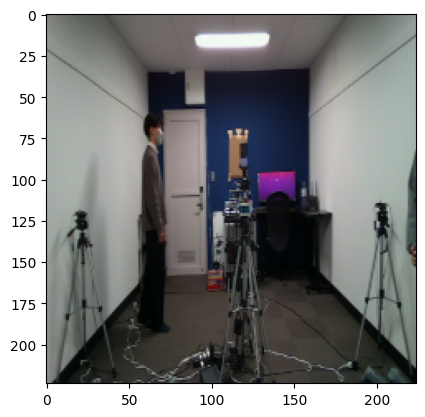

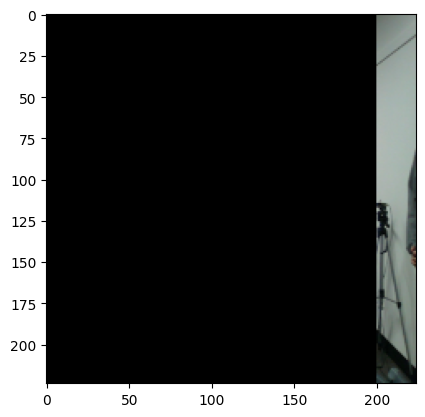

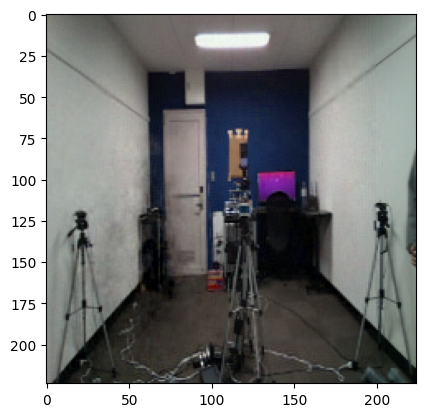

SSIM: 0.89234346
PSNR: 28.09660734682371
**************************************************************************************


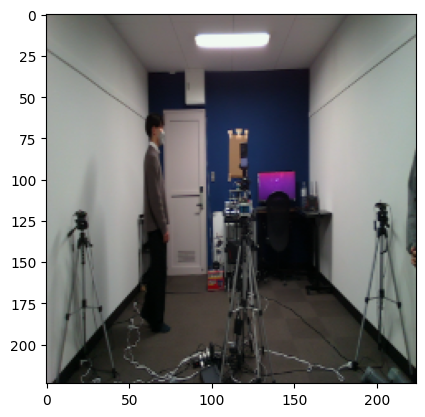

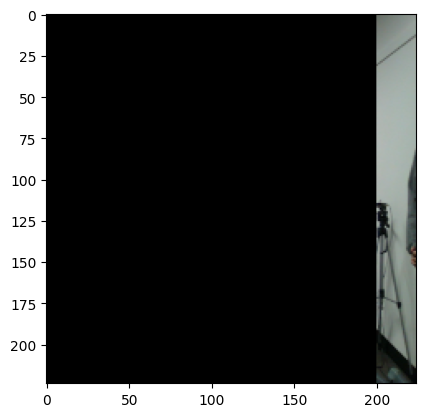

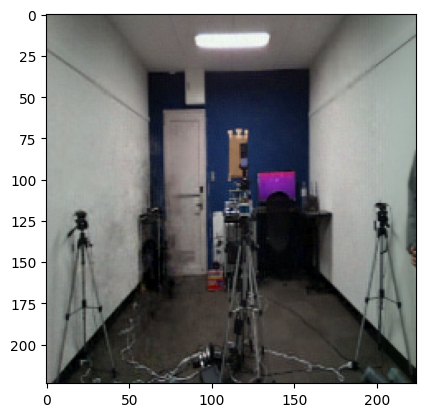

SSIM: 0.89741856
PSNR: 28.72216127670624
**************************************************************************************


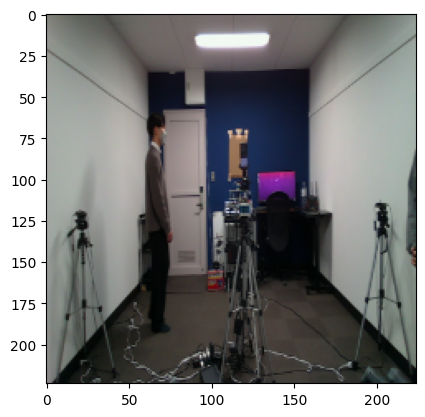

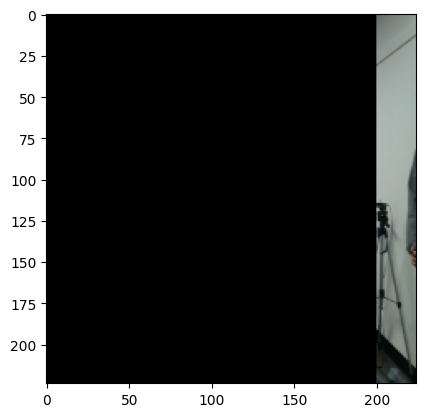

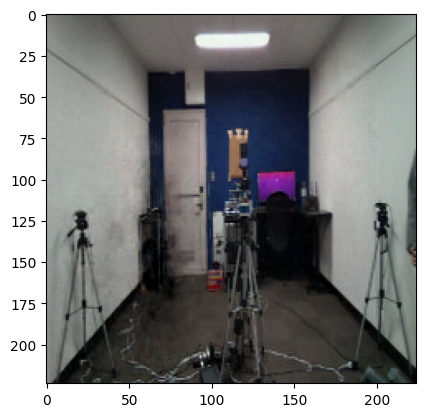

SSIM: 0.9008133
PSNR: 29.23114595098154
**************************************************************************************


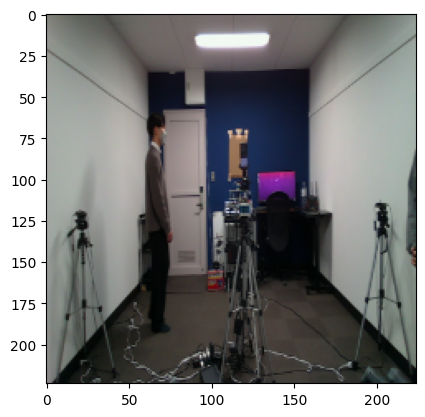

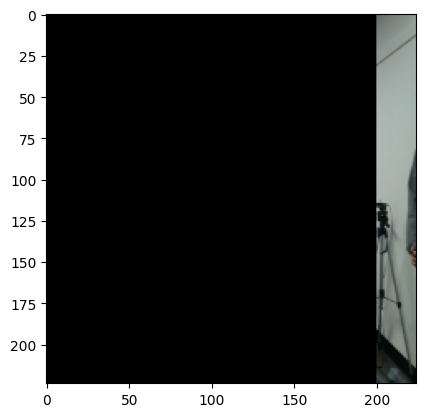

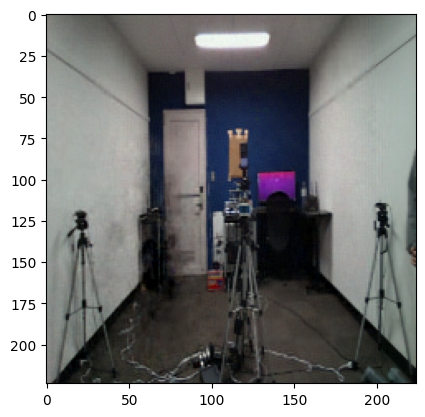

SSIM: 0.89893657
PSNR: 28.979718337553926
**************************************************************************************


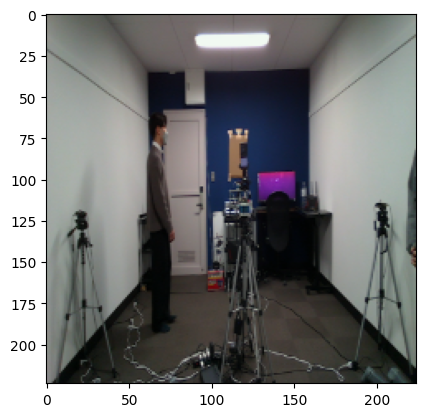

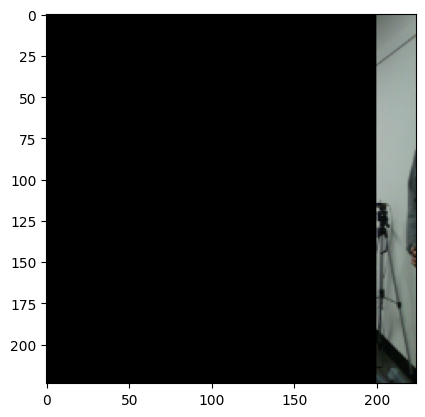

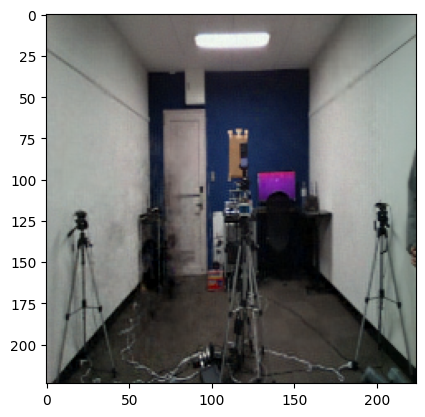

SSIM: 0.90089744
PSNR: 29.350642439145776
**************************************************************************************


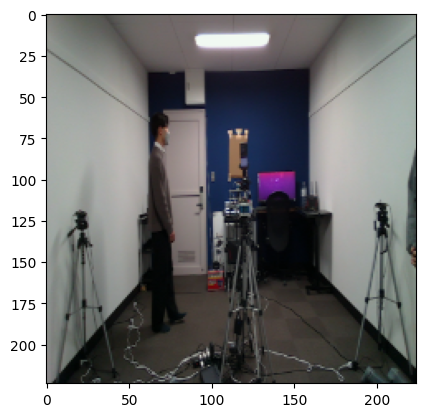

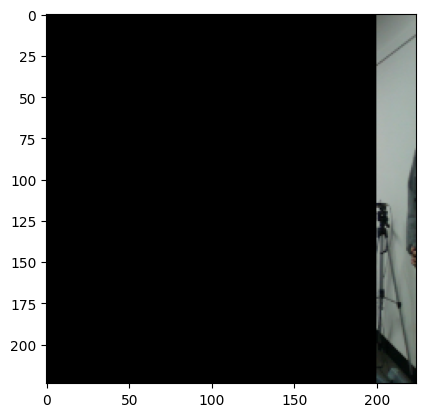

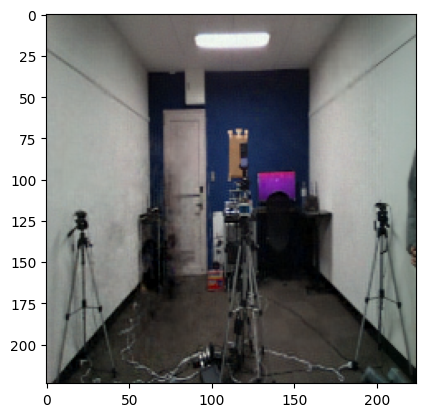

SSIM: 0.90211934
PSNR: 29.55846735987734
**************************************************************************************


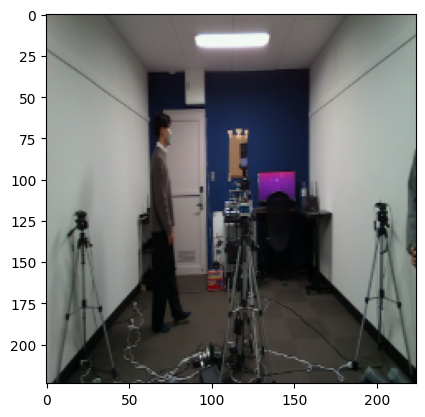

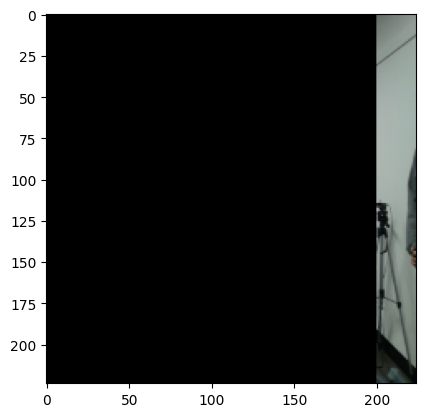

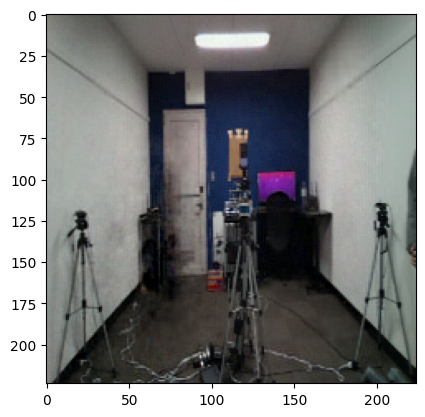

SSIM: 0.90255547
PSNR: 29.80667988365887
**************************************************************************************


In [54]:
for i in range(820, 850):

    plt.imshow(test_gd_img[i])
    plt.show()
    
    plt.imshow(test_blocked_img[i])
    plt.show()

    plt.imshow(recovered_img[i])
    plt.show()
    
    print("SSIM:", ssim(test_gd_img[i], recovered_img[i], multichannel=True, win_size=11, channel_axis=2, data_range=1))
    print("PSNR:", skimage.metrics.peak_signal_noise_ratio(test_gd_img[i], recovered_img[i], data_range=1.0))
    
    print("**************************************************************************************")

In [1]:
n = 20

plt.figure(figsize=(40, 4))
for i in range(n):
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(tf.squeeze(test_gd_img[i]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()


plt.figure(figsize=(40, 4))
for i in range(n):
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(tf.squeeze(test_blocked_img[i]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
 
    bx = plt.subplot(2, n, i + n + 1)
    plt.imshow(tf.squeeze(recovered_img[i]))
    plt.gray()
    bx.get_xaxis().set_visible(False)
    bx.get_yaxis().set_visible(False)
plt.show()


NameError: name 'plt' is not defined